In [1]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from imgaug import augmenters as iaa

In [2]:
def show_sample_images(images):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
    for img, ax in zip(images, axs):
        ax.imshow(img)
        ax.axis('off')
    plt.show()

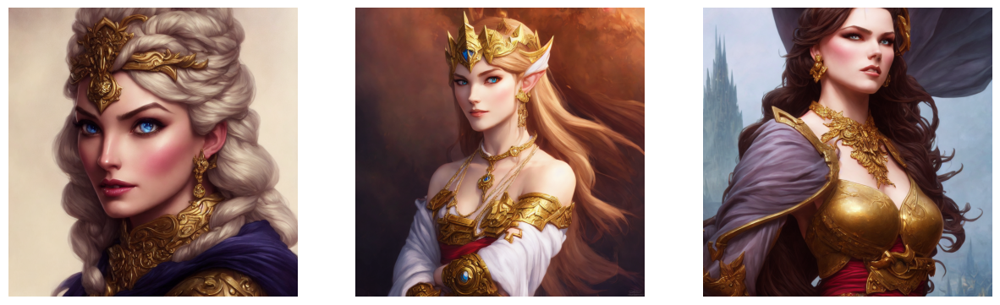

In [3]:
# Load 3 sample images, # Convert images to uint8
images = [(plt.imread("sample_images/{}.png".format(i+1)) * 255).astype(np.uint8) for i in range(3)]
show_sample_images(images)

In [4]:
# Print the shape and the type of each image
for img in images:
    print(img.shape, type(img), img.dtype, np.min(img), np.max(img))

(1024, 1024, 3) <class 'numpy.ndarray'> uint8 0 255
(1024, 1024, 3) <class 'numpy.ndarray'> uint8 0 255
(1024, 1024, 3) <class 'numpy.ndarray'> uint8 0 255


# Rotation

In [5]:
augmentation = iaa.Sequential([
    iaa.Rotate(rotate=(0, 365)) # rotate images by -45 to 45 degrees
])

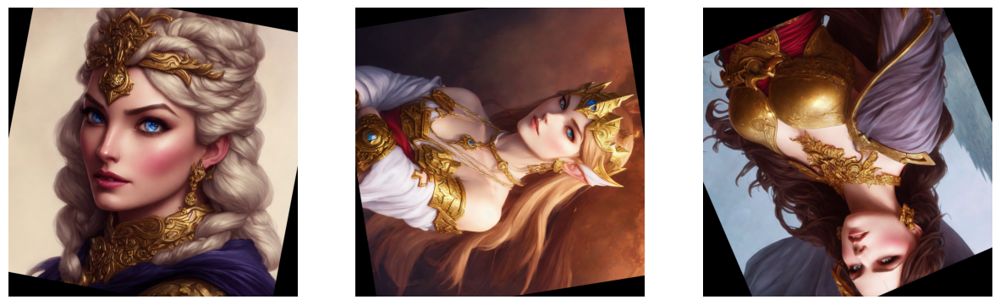

In [6]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Scale

In [7]:
augmentation = iaa.Sequential([
    iaa.Affine(scale=(0.5, 1.5))  # scale images by a factor of 0.5 to 1.5
    # iaa.ScaleY((0.5, 1.5))
    # iaa.ScaleX((0.5, 1.5))
])

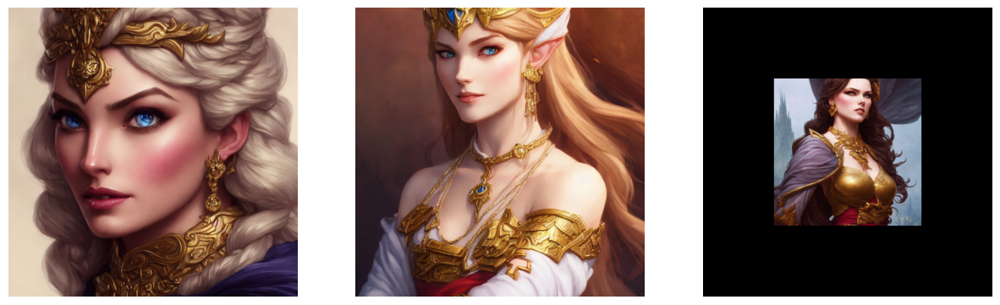

In [8]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Translation

In [9]:
augmentation = iaa.Sequential([
    #iaa.Affine(translate_px={"x": (-400, 400), "y": (-400, 400)})  # translate images by -400 to 400 pixels
    iaa.Affine(translate_percent={"x": (-0.4, 0.4), "y": (-0.4, 0.4)})  # translate images by -40 to 40 percent
    # iaa.TranslateY(px=(-20, 20))
    # iaa.TranslateX(px=(-20, 20))
])

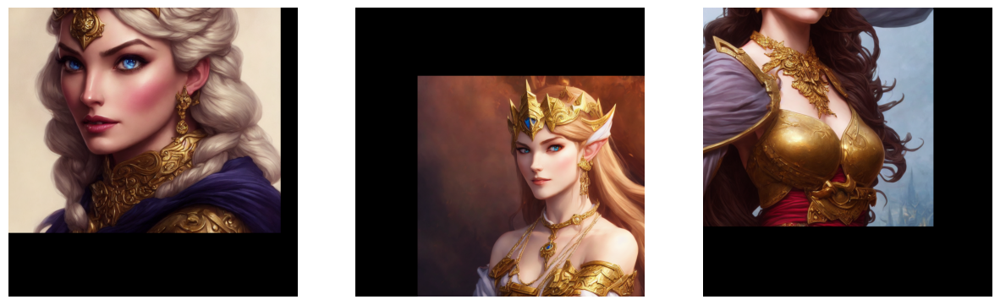

In [10]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Shear

In [11]:
augmentation = iaa.Sequential([
    iaa.Affine(shear=(-50, 50))  # apply shear transformation by -50 to 50 degrees
])

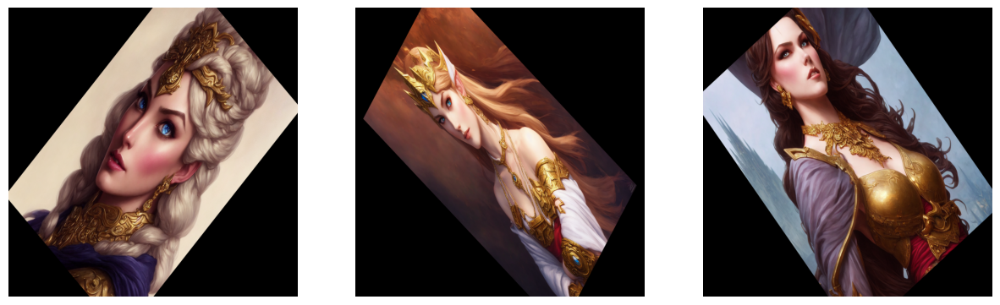

In [12]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Elastic deformation

In [13]:
augmentation = iaa.Sequential([
    iaa.ElasticTransformation(alpha=50, sigma=5)  # apply elastic deformation with alpha=50 and sigma=5
])

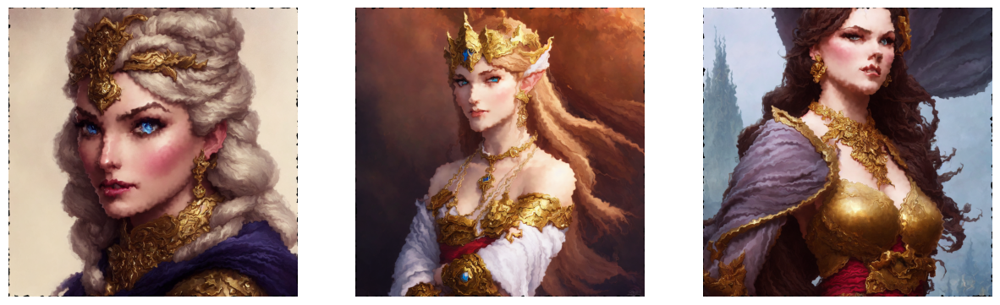

In [14]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Perspective transformation

In [15]:
augmentation = iaa.Sequential([
    iaa.PerspectiveTransform(scale=(0.1, 0.2))  # apply perspective transformations with scale=0.01 to 0.1
])

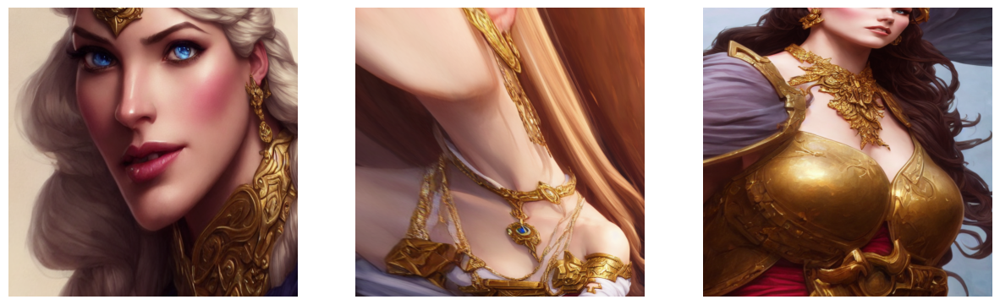

In [16]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Crop

In [17]:
augmentation = iaa.Sequential([
    iaa.Crop(px=(50, 400)) # crop image by a random value between 50 and 200 pixels
    #iaa.Crop(percent=(0.1, 0.4))
])

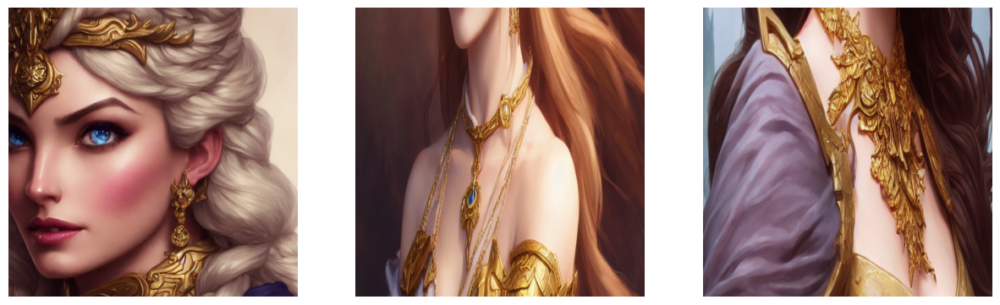

In [18]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Piecewise Affine

In [19]:
# Simulates non-linear deformations.
augmentation = iaa.Sequential([
    iaa.PiecewiseAffine(scale=(0.01, 0.05)) # apply piecewise affine transformation with a scale between 0.01 and 0.05
])

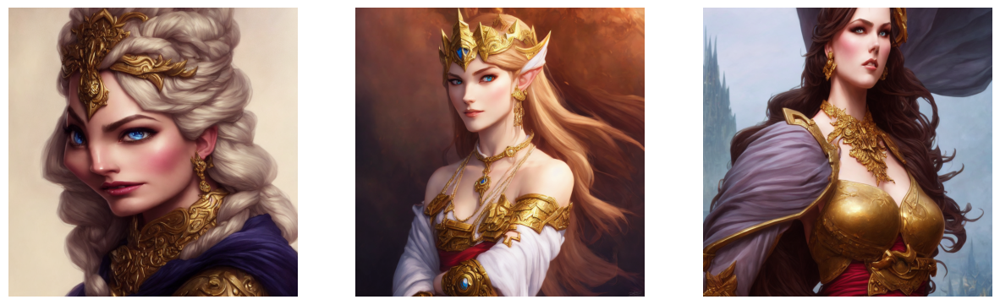

In [20]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Hue and Saturation

In [21]:
augmentation = iaa.Sequential([
    iaa.MultiplyHueAndSaturation((0.5, 1.2), per_channel=True) # multiply the hue and saturation by a random value between 0.5 and 1.5
])

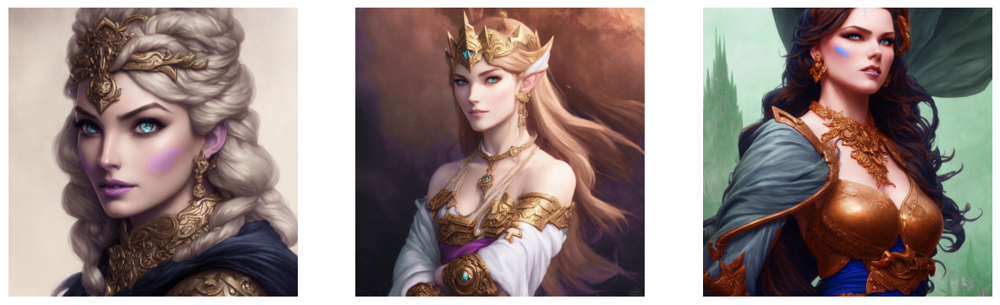

In [22]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Color Temperature

In [23]:
augmentation = iaa.Sequential([
    iaa.ChangeColorTemperature((1100, 10000)) # change the color temperature of the image between 1100 and 10000 degrees Kelvin
])

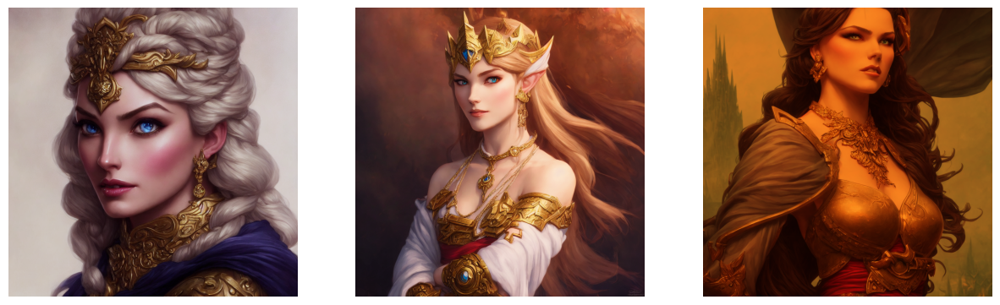

In [24]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Color Quantization

In [25]:
augmentation = iaa.Sequential([
    #iaa.UniformColorQuantization(n_colors=8) # reduce the number of colors in the image to 8
    iaa.KMeansColorQuantization(n_colors=16)
])

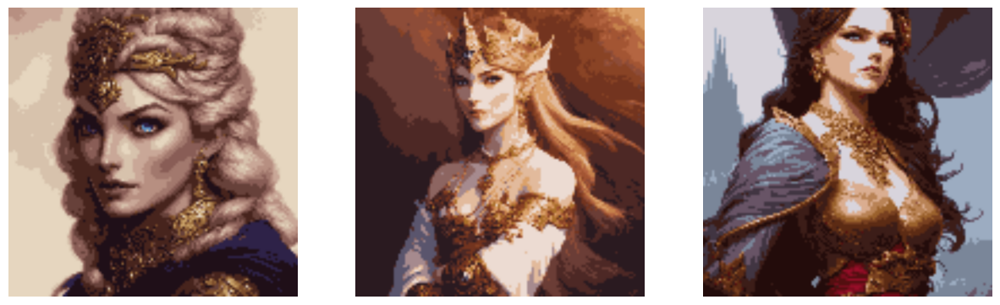

In [26]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Color Channel Shuffle

In [27]:
augmentation = iaa.Sequential([
    iaa.ChannelShuffle(p=1.0) # randomly shuffle the color channels in the image
])

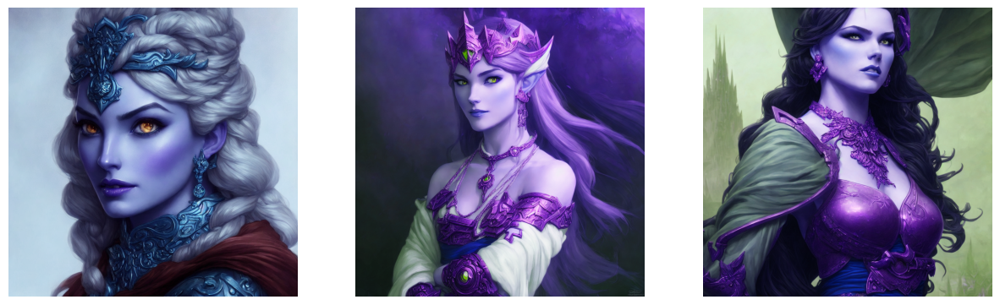

In [28]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Grayscale

In [29]:
augmentation = iaa.Sequential([
    iaa.Grayscale(alpha=(0.5, 1.0)) # convert the image to grayscale with a random alpha value between 0.5 and 1.0
])

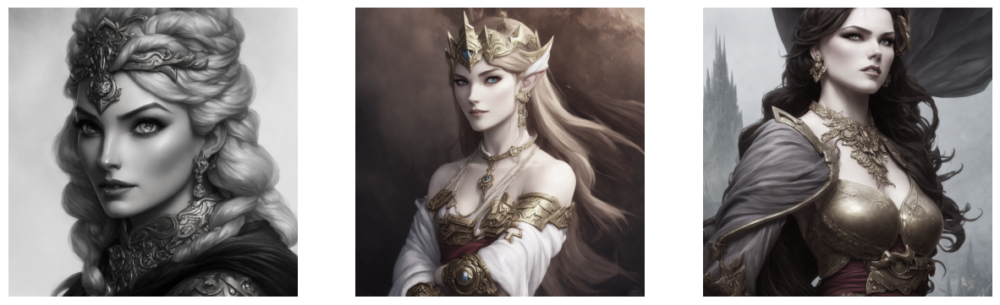

In [30]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)

# Applying Multiple Filters

In [31]:
augmentation = iaa.Sequential([
    iaa.Grayscale(alpha=1.0),
    iaa.KMeansColorQuantization(n_colors=8),
    iaa.ChangeColorTemperature(4500)
])

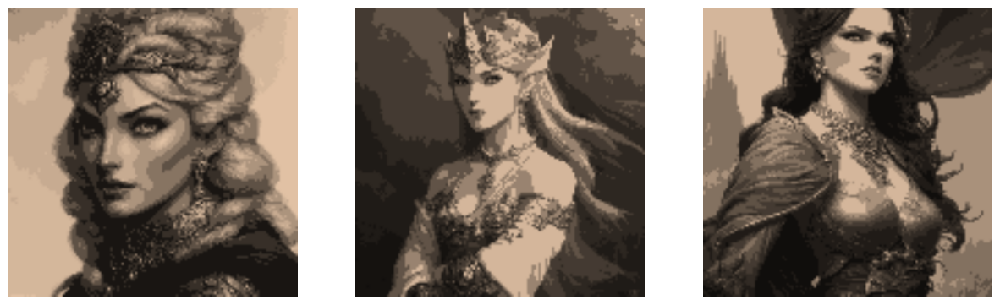

In [32]:
augmented_images = augmentation(images=images)
show_sample_images(augmented_images)